In [240]:
import io
import os
import shutil
import json
import random
import numpy as np
import pickle
import matplotlib.pyplot as plt
import pandas as pd
import keras
from keract import get_activations
from sklearn.model_selection import train_test_split
from sklearn.metrics import matthews_corrcoef, hamming_loss

In [241]:
taglist = ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']

current = os.getcwd()

storage_dir = os.path.join(current + '/Final model/Training/')
test_dir =  os.path.join(current + '/Final model/Test/')

In [242]:
with open('trainingv2.pkl', 'rb') as file:
    training_data = pickle.load(file)
with open('testv2.pkl', 'rb') as file:
    test_data = pickle.load(file)

#### Load to imagedatagenerator

In [243]:
formatted_train = [[str(x[0])+'.jpg']+list(x[1]) for x in training_data]
formatted_test = [[str(x[0])+'.jpg']+list(x[1]) for x in test_data]

train, val = train_test_split(formatted_train, train_size=0.9, random_state=15)

df_weeb_train = pd.DataFrame(train, columns = ['filename', '1girl', 'long_hair', 'blush', 'smile', 'short_hair'])
df_weeb_val = pd.DataFrame(val, columns = ['filename', '1girl', 'long_hair', 'blush', 'smile', 'short_hair'])
df_weeb_test = pd.DataFrame(formatted_test, columns = ['filename', '1girl', 'long_hair', 'blush', 'smile', 'short_hair'])

C:\Users\rapha\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [244]:
test_ids = np.array([x[0] for x in test_data])
test_labels = np.array([x[1] for x in test_data])

In [245]:
from keras.preprocessing.image import ImageDataGenerator
#Data augmentation
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   horizontal_flip=True,
                                   rotation_range=25,
                                   height_shift_range=0.1,
                                   width_shift_range=0.1)

val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']

train_generator = train_datagen.flow_from_dataframe(
        dataframe = df_weeb_train,
        directory = storage_dir,
        x_col = 'filename',
        y_col = taglist,
        target_size=(256, 256),
        batch_size=100,
        class_mode='other')

val_generator = val_datagen.flow_from_dataframe(
        dataframe = df_weeb_val,
        directory = storage_dir,
        x_col = 'filename',
        y_col = taglist,
        target_size=(256, 256),
        batch_size=50,
        class_mode='other')

test_generator = test_datagen.flow_from_dataframe(
        dataframe = df_weeb_test,
        directory = test_dir,
        x_col = 'filename',
        y_col = taglist,
        target_size=(256, 256),
        batch_size=50,
        class_mode='other')

Found 8853 images.
Found 984 images.
Found 982 images.


#### Model 1: EC2-trained, activation: Sigmoid

In [246]:
from keras import layers
from keras import models
from keras import optimizers
from keras import regularizers
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [247]:
from keras import layers
from keras import models
from keras import optimizers
from keras import regularizers
from keras import callbacks

callback = [EarlyStopping(monitor='val_loss', patience=2), ModelCheckpoint(filepath='weeb_current.h5', monitor='val_loss', save_best_only=True)]

model_sig = models.Sequential()
model_sig.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(256, 256, 3)))
model_sig.add(layers.Conv2D(32, (3, 3), activation='relu'))
model_sig.add(layers.MaxPooling2D((2, 2)))

model_sig.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_sig.add(layers.MaxPooling2D((2, 2)))
model_sig.add(layers.Dropout(rate=0.15))

model_sig.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_sig.add(layers.MaxPooling2D((2, 2)))
model_sig.add(layers.Dropout(rate=0.15))

model_sig.add(layers.Flatten())

model_sig.add(layers.Dense(256, activation='relu'))
model_sig.add(layers.Dropout(rate=0.4))

model_sig.add(layers.Dense(5, activation='sigmoid'))

model_sig.compile(loss='binary_crossentropy',
              optimizer=optimizers.Adam(),
              metrics=['acc'])

In [248]:
model_sig.load_weights('weeb_ec2_lastrun.h5')

#### Model 2: EC2-trained, activation: Relu

In [249]:
model_relu = models.Sequential()
model_relu.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(256, 256, 3)))
model_relu.add(layers.Conv2D(32, (3, 3), activation='relu'))
model_relu.add(layers.MaxPooling2D((2, 2)))

model_relu.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_relu.add(layers.MaxPooling2D((2, 2)))
model_relu.add(layers.Dropout(rate=0.15))

model_relu.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_relu.add(layers.MaxPooling2D((2, 2)))
model_relu.add(layers.Dropout(rate=0.15))

model_relu.add(layers.Flatten())

model_relu.add(layers.Dense(256, activation='relu'))
model_relu.add(layers.Dropout(rate=0.4))

model_relu.add(layers.Dense(5, activation='relu'))

model_relu.compile(loss='binary_crossentropy',
              optimizer=optimizers.Adam(),
              metrics=['acc'])

In [250]:
model_relu.load_weights('weeb_ec2_relu.h5')

#### Model 3: LDA model

In [ ]:
with open('training_LDAv2.pkl', 'rb') as file:
    training_data_LDA = pickle.load(file)
with open('test_LDAv2.pkl', 'rb') as file:
    test_data_LDA = pickle.load(file)

In [ ]:
formatted_train_LDA = [[str(x[0])+'.jpg']+list(x[2]) for x in training_data_LDA]
formatted_test_LDA = [[str(x[0])+'.jpg']+list(x[2]) for x in test_data_LDA]

train2, val2 = train_test_split(formatted_train_LDA, train_size=0.9, random_state=15)

df_weeb_train_LDA = pd.DataFrame(train2, columns = ['filename',0,1,2,3,4,5,6,7,8,9])
df_weeb_val_LDA = pd.DataFrame(val2, columns = ['filename',0,1,2,3,4,5,6,7,8,9])
df_weeb_test_LDA = pd.DataFrame(formatted_test_LDA, columns = ['filename',0,1,2,3,4,5,6,7,8,9])

In [ ]:
train_datagen_LDA = ImageDataGenerator(rescale=1./255, 
                                   horizontal_flip=True,
                                   rotation_range=25,
                                   height_shift_range=0.1,
                                   width_shift_range=0.1)

val_datagen_LDA = ImageDataGenerator(rescale=1./255)
test_datagen_LDA = ImageDataGenerator(rescale=1./255)
col_list = list(df_weeb_test.columns[1:])

# ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']

train_generator_LDA = train_datagen_LDA.flow_from_dataframe(
        dataframe = df_weeb_train_LDA,
        directory = storage_dir,
        x_col = 'filename',
        y_col = [0,1,2,3,4,5,6,7,8,9],
        target_size=(256, 256),
        batch_size=20,
        class_mode='other')

val_generator_LDA = val_datagen_LDA.flow_from_dataframe(
        dataframe = df_weeb_val_LDA,
        directory = storage_dir,
        x_col = 'filename',
        y_col = [0,1,2,3,4,5,6,7,8,9],
        target_size=(256, 256),
        batch_size=20,
        class_mode='other')

test_generator_LDA = test_datagen_LDA.flow_from_dataframe(
        dataframe = df_weeb_test_LDA,
        directory = test_dir,
        x_col = 'filename',
        y_col = [0,1,2,3,4,5,6,7,8,9],
        target_size=(256, 256),
        batch_size=20,
        class_mode='other')

In [ ]:
model2 = models.Sequential()

model2.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(256, 256, 3)))

model2.add(layers.Conv2D(32, (3, 3), activation='relu'))
model2.add(layers.MaxPooling2D((2, 2)))

model2.add(layers.Conv2D(64, (3, 3), activation='relu'))
model2.add(layers.MaxPooling2D((2, 2)))
model2.add(layers.Dropout(rate=0.15))

model2.add(layers.Conv2D(128, (3, 3), activation='relu'))
model2.add(layers.MaxPooling2D((2, 2)))
model2.add(layers.Dropout(rate=0.15))

model2.add(layers.Flatten())

model2.add(layers.Dense(256, activation='relu'))
model2.add(layers.Dropout(rate=0.4))

model2.add(layers.Dense(10, activation='softmax'))

model2.compile(loss='mean_squared_error',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

In [ ]:
model2.load_weights('weeb_LDAv2.h5')

### Part 1: Prediction

In [ ]:
prediction_relu = model_relu.predict_generator(test_generator, steps=20, verbose=1)
prediction_sig = model_sig.predict_generator(test_generator, steps=20, verbose=1)
# prediction_LDA = model2.predict_generator(test_generator_LDA, steps=20, verbose=1)

In [ ]:
with open('pred_relu.pkl', 'wb') as file:
    pickle.dump(prediction_relu, file)
with open('pred_sig.pkl', 'wb') as file:
    pickle.dump(prediction_sig, file)
with open('pred_LDA.pkl', 'wb') as file:
    pickle.dump(prediction_LDA, file)

In [13]:
with open('pred_relu.pkl', 'rb') as file:
    prediction_relu = pickle.load(file)
with open('pred_sig.pkl', 'rb') as file:
    prediction_sig = pickle.load(file)

In [14]:
'''
Modified code from Suraj Deshmukh (https://github.com/suraj-deshmukh/Keras-Multi-Label-Image-Classification/blob/master/miml.ipynb)
Used to determine threshold for binary tags
'''
def threshold(array, actual):
    threshold = np.arange(0.05,0.95,0.05)
    
    acc = []
    accuracies = []
    final_labels = []
    
    number_of_labels = array.shape[1]
    
    best = np.zeros(number_of_labels)
    
    for i in range(number_of_labels):
        y_prob = np.array(array[:,i]) #Gets a column
        for j in threshold:
            y_pred = [1 if prob >= j else 0 for prob in y_prob]
            acc.append(matthews_corrcoef(actual[:,i], y_pred))

        acc = np.array(acc)
        index = np.where(acc==acc.max()) 
        accuracies.append(acc.max()) 
        best[i] = threshold[index[0][0]]
        acc = []

    for row in range(len(actual)):
        label = np.zeros(number_of_labels)
        for col in range(number_of_labels):
            if array[row,col] >= best[col]:
                label[col] = 1
        final_labels.append(label)
    
    final_labels = np.array(final_labels)
    
    return best, final_labels

In [15]:
def ave_threshold(array):
    final_labels = []
    
    for i in range(len(array)):
        average = np.mean(array[i])
        std  = np.std(array[i])
        label = np.array([1 if x >= average else 0 for x in array[i]])
        final_labels.append(label)
    
    final_labels = np.array(final_labels)
    
    return final_labels

In [16]:
thresh_relu, labels_relu = threshold(prediction_relu, test_labels)
thresh_sig, labels_sig = threshold(prediction_sig, test_labels)

C:\Users\rapha\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:538: RuntimeWarning: invalid value encountered in double_scalars
  mcc = cov_ytyp / np.sqrt(cov_ytyt * cov_ypyp)


In [17]:
labels_relu_ave = ave_threshold(prediction_relu)
labels_sig_ave = ave_threshold(prediction_sig)

In [18]:
hamming_loss(test_labels, labels_relu), hamming_loss(test_labels,labels_sig),\
hamming_loss(test_labels, labels_relu_ave), hamming_loss(test_labels, labels_sig_ave)

(0.49572301425661913,
 0.4920570264765784,
 0.36517311608961306,
 0.42973523421588594)

In [19]:
thresh_relu, thresh_sig

(array([0.25, 0.15, 0.15, 0.25, 0.05]), array([0.4 , 0.25, 0.2 , 0.2 , 0.3 ]))

In [20]:
sum(labels_relu), sum(labels_sig), sum(labels_relu_ave), sum(labels_sig_ave), sum(test_labels)

(array([529., 981., 625.,   1., 982.]),
 array([336., 861., 624., 902.,   3.]),
 array([981, 940,   2,  43, 157]),
 array([742, 678, 236, 183, 311]),
 array([766., 543., 390., 350., 295.]))

In [364]:
def evaluate(labels):
    exact_match = []
    absolute_fail = []

    for row in range(len(test_labels)):
        check = 0
        n = 0
        for col in range(5):
            if test_labels[row, col] == labels[row, col]:
                check += 1
            else:
                n += 1

        if check == 5:
            exact_match.append((test_ids[row], test_labels[row], labels[row]))
        if n == 5:
            absolute_fail.append((test_ids[row], test_labels[row], labels[row]))
    return exact_match, absolute_fail

In [365]:
exact_relu, no_relu = evaluate(labels_relu)
exact_sig, no_sig = evaluate(labels_sig)
exact_relu_ave, no_relu_ave = evaluate(labels_relu_ave)
exact_sig_ave, no_sig_ave = evaluate(labels_sig_ave)

In [366]:
(len(exact_relu), len(exact_sig),\
len(exact_relu_ave), len(exact_sig_ave))

(8, 30, 129, 55)

In [367]:
(len(no_relu), len(no_sig),\
len(no_relu_ave), len(no_sig_ave))

(14, 44, 12, 18)

In [369]:
no_sig_ave

[(2909082, array([1., 0., 0., 1., 0.]), array([0, 1, 1, 0, 1])),
 (2275033, array([1., 0., 1., 0., 0.]), array([0, 1, 0, 1, 1])),
 (1871020, array([0., 0., 1., 1., 1.]), array([1, 1, 0, 0, 0])),
 (2525092, array([0., 0., 1., 1., 1.]), array([1, 1, 0, 0, 0])),
 (1751089, array([0., 1., 1., 1., 1.]), array([1, 0, 0, 0, 0])),
 (1504061, array([1., 0., 0., 1., 0.]), array([0, 1, 1, 0, 1])),
 (1831001, array([0., 1., 1., 1., 1.]), array([1, 0, 0, 0, 0])),
 (2266037, array([1., 0., 1., 0., 0.]), array([0, 1, 0, 1, 1])),
 (2155051, array([1., 0., 1., 0., 0.]), array([0, 1, 0, 1, 1])),
 (2171099, array([1., 0., 0., 1., 1.]), array([0, 1, 1, 0, 0])),
 (2465002, array([0., 1., 1., 1., 1.]), array([1, 0, 0, 0, 0])),
 (2060083, array([1., 0., 1., 1., 0.]), array([0, 1, 0, 0, 1])),
 (2911016, array([0., 0., 1., 1., 1.]), array([1, 1, 0, 0, 0])),
 (2513080, array([0., 1., 1., 1., 1.]), array([1, 0, 0, 0, 0])),
 (2092030, array([1., 0., 1., 0., 0.]), array([0, 1, 0, 1, 1])),
 (893069, array([0., 1., 

In [25]:
relu_tag_correct = [0,0,0,0,0]
sig_tag_correct = [0,0,0,0,0]

for row in range(len(test_labels)):
    for col in range(5):
        if test_labels[row, col] == labels_relu[row, col]:
            relu_tag_correct[col] += 1
        
        if test_labels[row, col] == labels_sig[row, col]:
            sig_tag_correct[col] += 1

#['1girl', 'long_hair', 'blush', 'smile', 'short_hair']
relu_tag_correct, sig_tag_correct

([521, 544, 483, 633, 295], [412, 540, 472, 384, 686])

##### Visualized results
Source: Modified from Deep Learning with Python (5.4-visualizing-what-convnets-learn)

In [234]:
%matplotlib inline
from keras.preprocessing import image

In [289]:
filepath = os.path.join(test_dir+str(2550034)+'.jpg')
img= image.load_img(filepath, target_size=(256,256))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

model_key_relu = get_activations(model_relu, img_tensor)
included = list(model_key_relu.keys())[:5]
model_key_relu = {i:j for i,j in model_key_relu.items() if i in included}

model_key_sig = get_activations(model_sig, img_tensor)
included = list(model_key_sig.keys())[:5]
model_key_sig = {i:j for i,j in model_key_sig.items() if i in included}

In [375]:
'''
Modified code from Francis Chollet, Deep Learning with Python notebooks

Modified to allow for:
 >> Use of keract for getting activations, 
 >> Mapping to grab specific images in the activation visualization
 >> Flexibility in analyzing whether it came from the ReLu model or Sigmoid model
'''

def draw_grid(file, model_used):
    filepath = os.path.join(test_dir+str(file)+'.jpg')
    img= image.load_img(filepath, target_size=(256,256))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor /= 255.
    
    if model_used == model_relu:
        labels = labels_relu
        labels2 = labels_relu_ave
    else:
        labels = labels_sig
        labels2 = labels_sig_ave
    
    print("Tags = ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']")
    print('Actual labels: ', test_labels[list(test_ids).index(file)])
    print('Predicted (threshold): ', labels[list(test_ids).index(file)])
    print('Predicted (average): ', labels2[list(test_ids).index(file)])
    
    plt.figure(figsize=(5,5))
    plt.imshow(img_tensor[0])
    
    activation_dct = get_activations(model_used, img_tensor)
    included = list(activation_dct.keys())[:5]
    activation_dct = {i:j for i,j in activation_dct.items() if i in included}

    images_per_row = 8

    # Now let's display our feature maps
    total_grid = {}
    loc_list = {'model_used':model_used}
    
    for layer_name, layer_activation in activation_dct.items():
        n_features = layer_activation.shape[-1]
        size = layer_activation.shape[1]
        
        n_cols = n_features // images_per_row
        display_grid = np.zeros((size * n_cols, images_per_row * size))
        
        loc_list[layer_name] = {}
        
        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0,
                                                 :, :,
                                                 col * images_per_row + row]
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size,
                             row * size : (row + 1) * size] = channel_image
                x = (col * size, (col + 1) * size)
                y = (row * size, (row + 1) * size)
        
                loc_list[layer_name][(col, row)] = (x,y)
        total_grid[layer_name] = display_grid
        
        scale = 1. / size *1.6
        plt.figure(figsize=(scale * display_grid.shape[1],
                            scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='cividis')

    return total_grid, loc_list
    plt.show()

In [376]:
def grab_from_grid(mapped, loc, layer, coord):
    x = loc['model_used']
    if x == model_relu:
        setmode = list(model_key_relu.keys())
    else:
        setmode = list(model_key_sig.keys())
    print(setmode)
    
    location = loc[setmode[layer]][coord]
    plt.imshow(mapped[setmode[layer]][location[0][0]:location[0][1],location[1][0]:location[1][1]], cmap='cividis')

#### Testing functions

Tags = ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']
Actual labels:  [0. 1. 0. 0. 1.]
Predicted (threshold):  [0. 1. 0. 0. 1.]
Predicted (average):  [1 1 0 0 1]


C:\Users\rapha\Anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


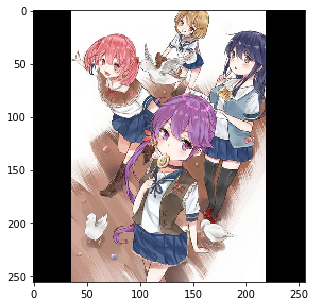

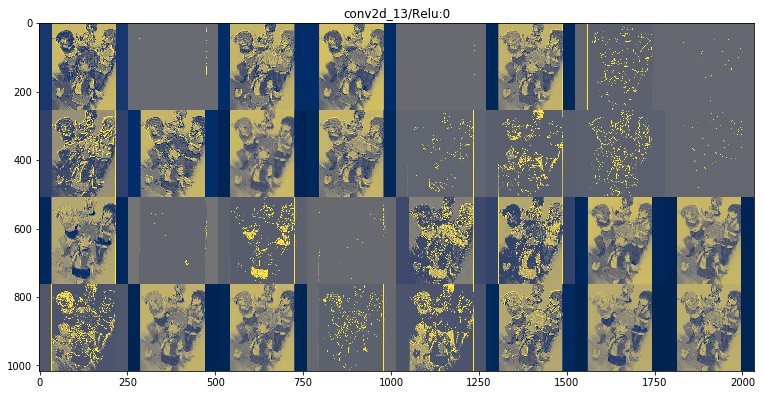

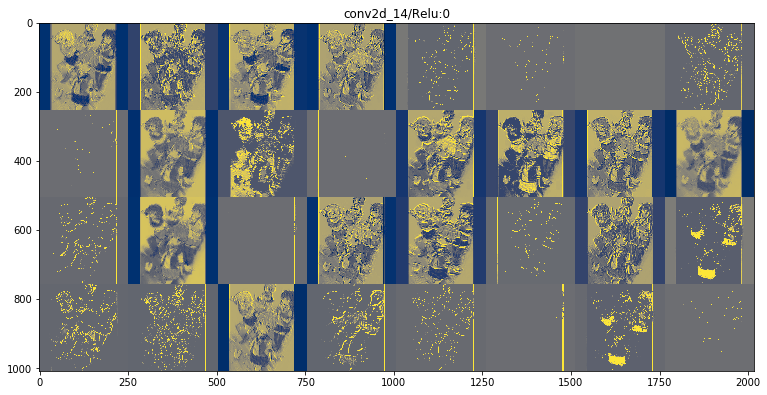

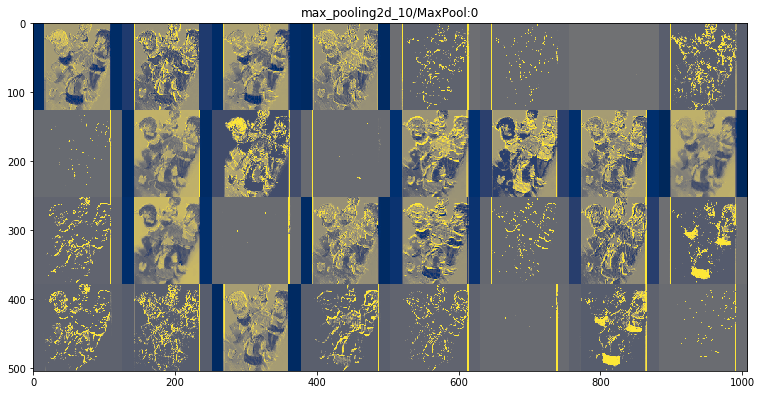

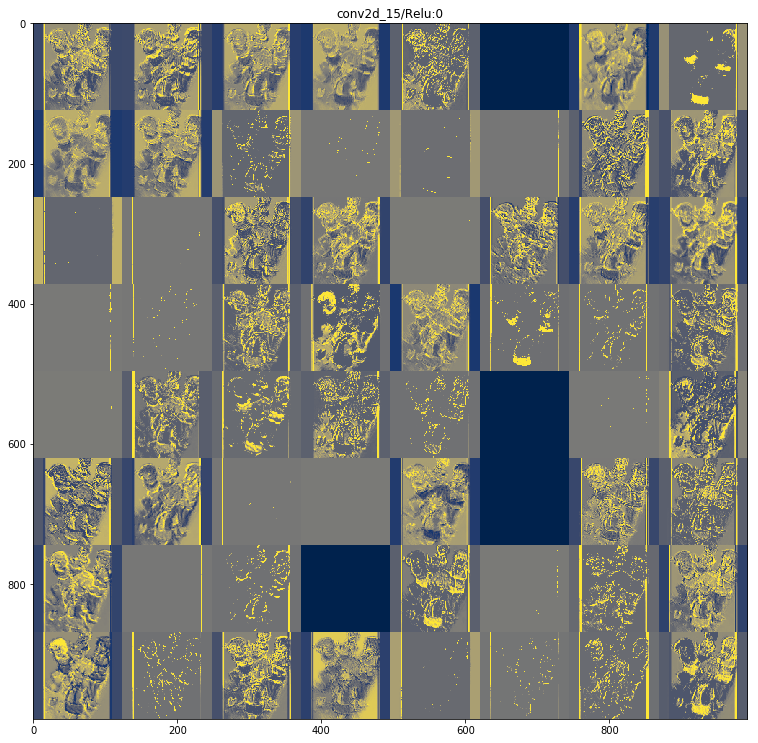

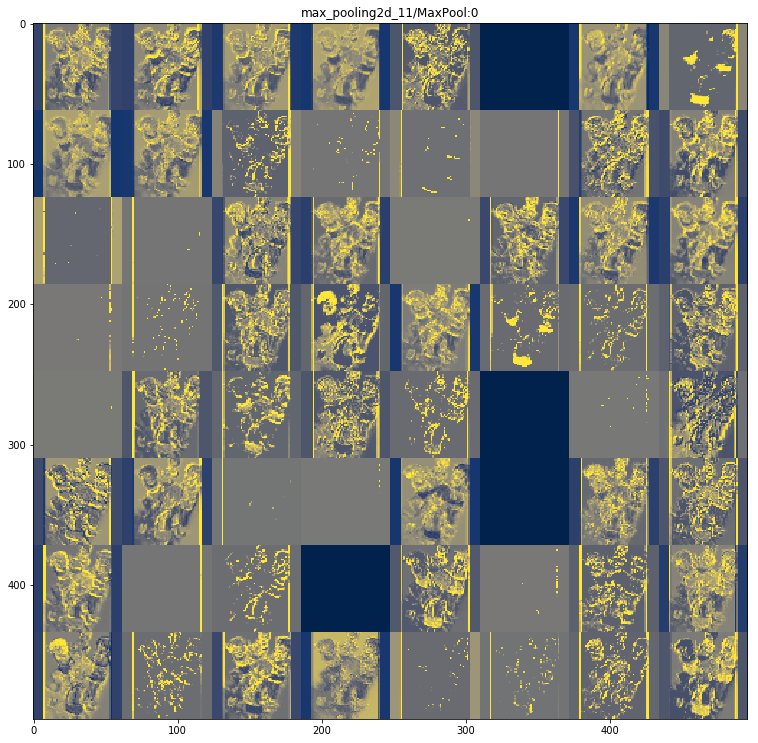

In [377]:
akebono, loc = draw_grid(2550034, model_relu)

['conv2d_13/Relu:0', 'conv2d_14/Relu:0', 'max_pooling2d_10/MaxPool:0', 'conv2d_15/Relu:0', 'max_pooling2d_11/MaxPool:0']


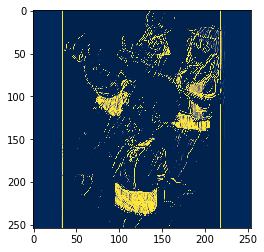

In [378]:
grab_from_grid(akebono, loc, 0, (2,2))

#### Successes

Tags = ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']
Actual labels:  [0. 1. 1. 0. 0.]
Predicted (threshold):  [0. 1. 1. 1. 0.]
Predicted (average):  [0 1 1 0 0]


C:\Users\rapha\Anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


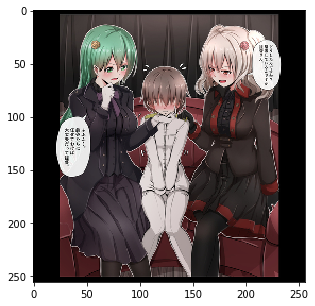

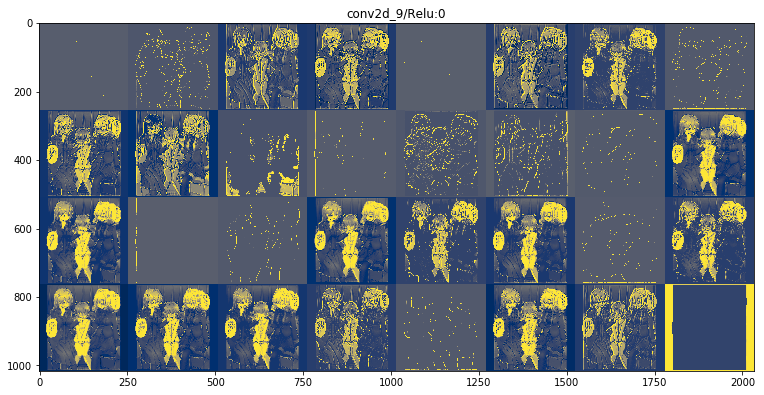

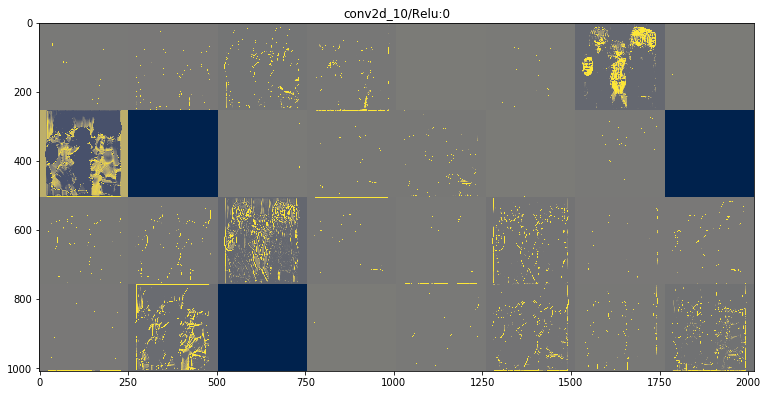

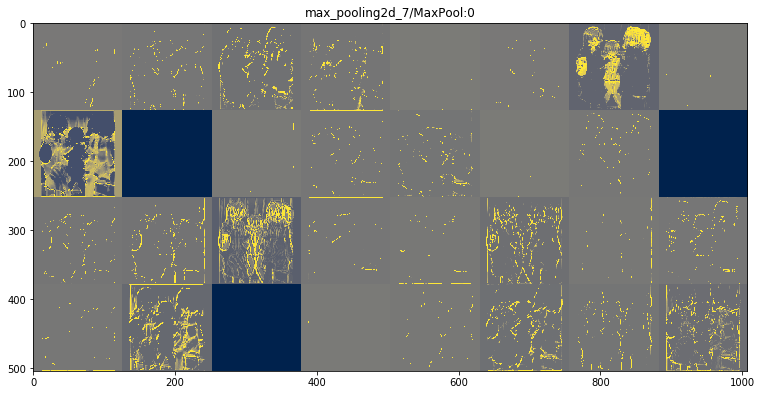

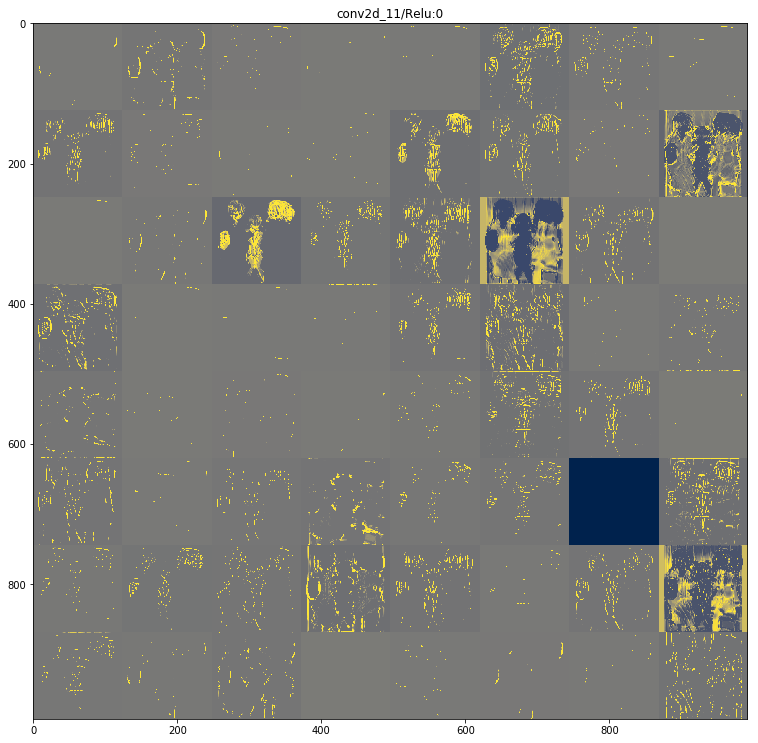

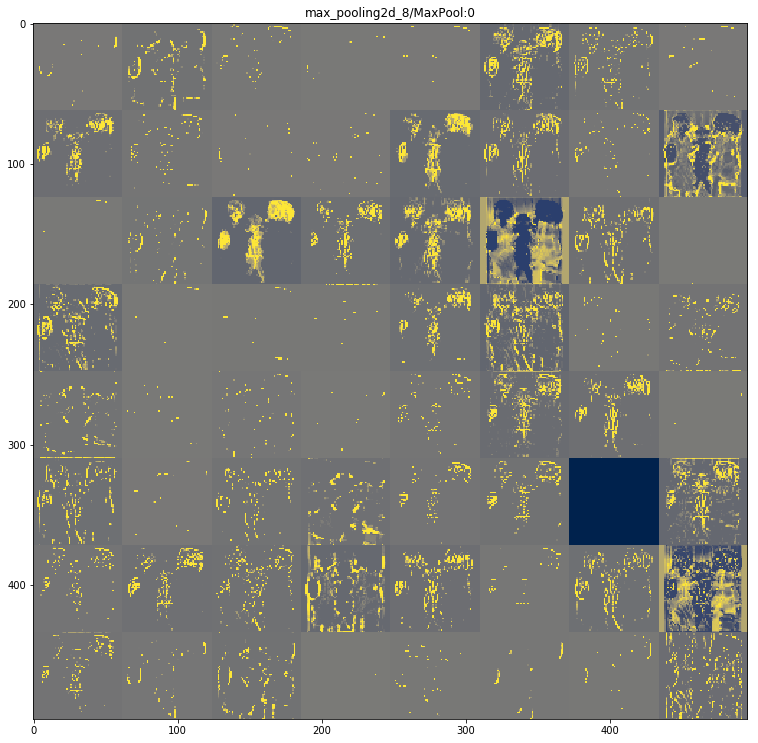

In [381]:
a,b = draw_grid(2602057, model_sig)

### Absolute misclassification

Tags = ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']
Actual labels:  [1. 0. 1. 1. 0.]
Predicted (threshold):  [0. 1. 1. 0. 1.]
Predicted (average):  [1 1 0 0 1]


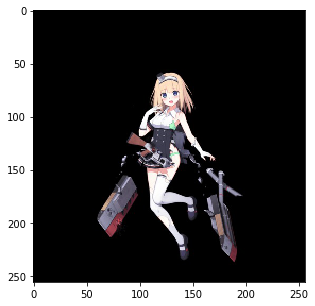

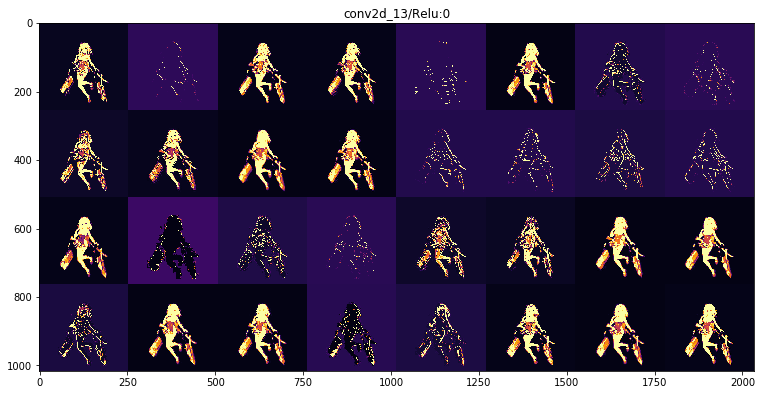

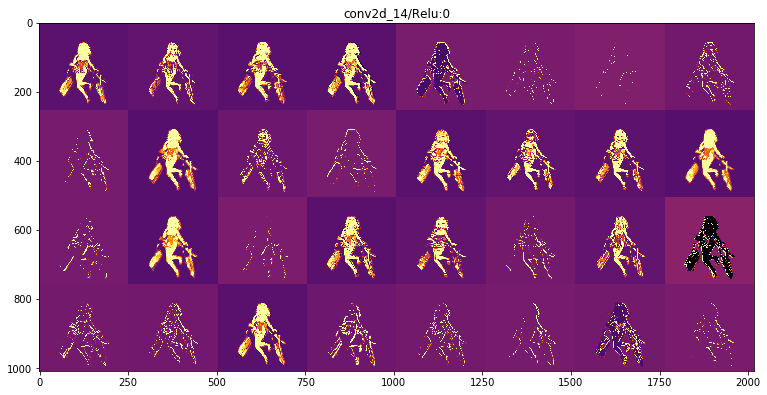

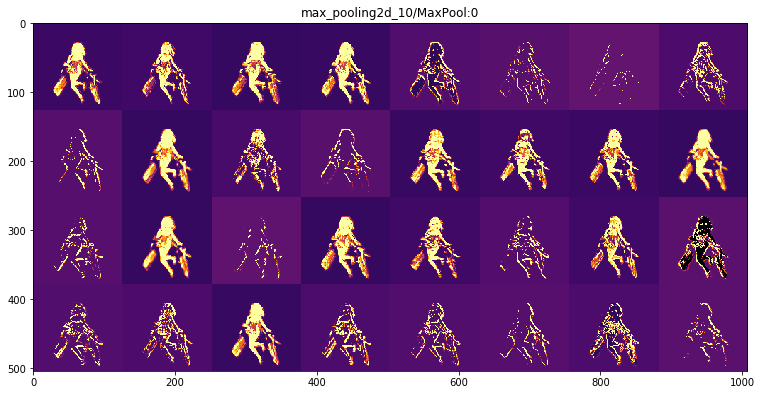

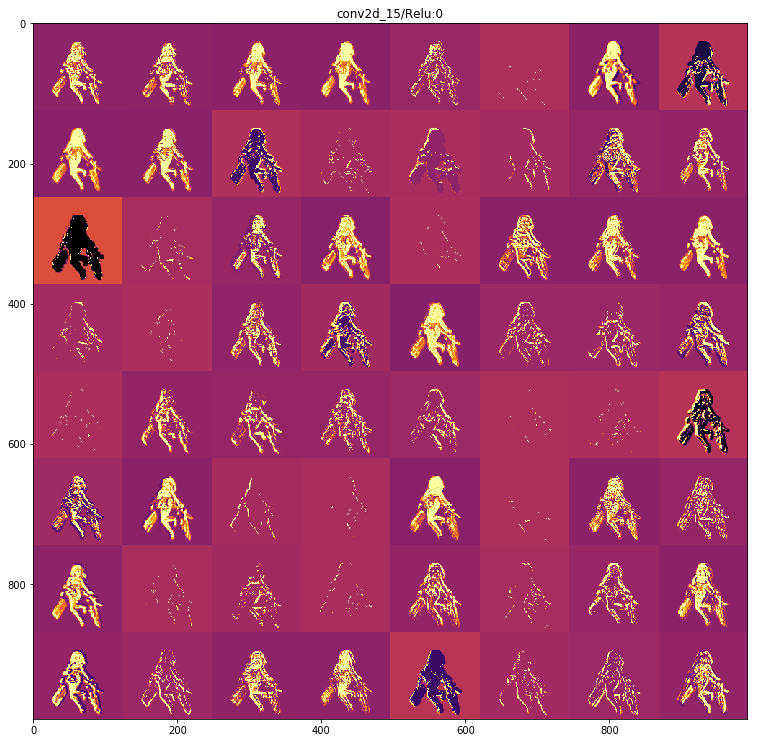

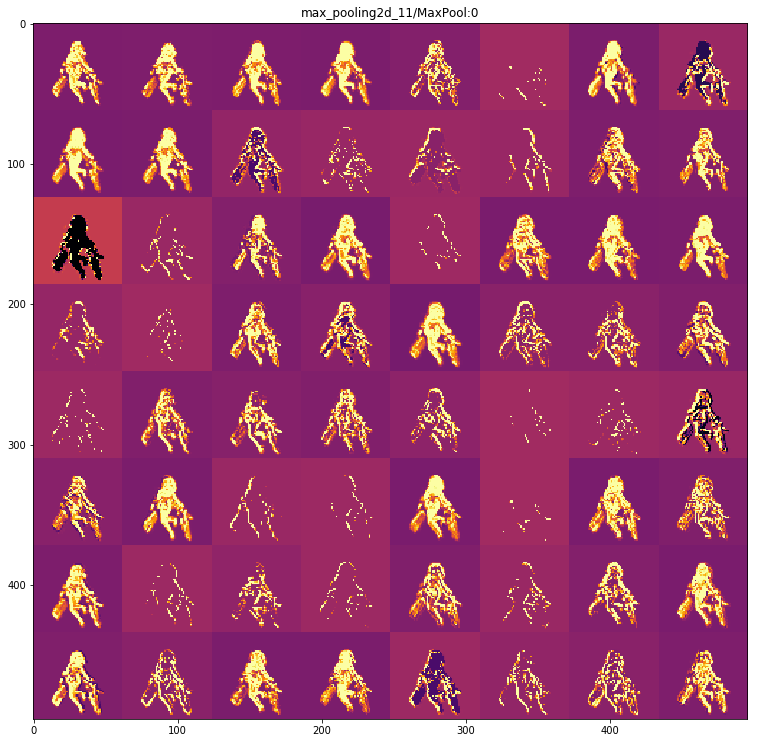

In [356]:
a,b = draw_grid(2516012, model_relu)

Tags = ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']
Actual labels:  [1. 0. 1. 1. 0.]
Predicted (threshold):  [0. 1. 0. 0. 1.]
Predicted (average):  [1 1 0 0 0]


C:\Users\rapha\Anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


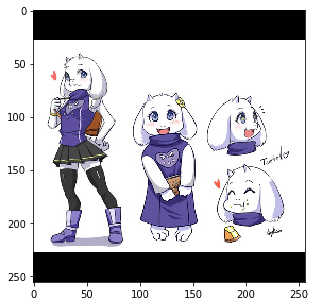

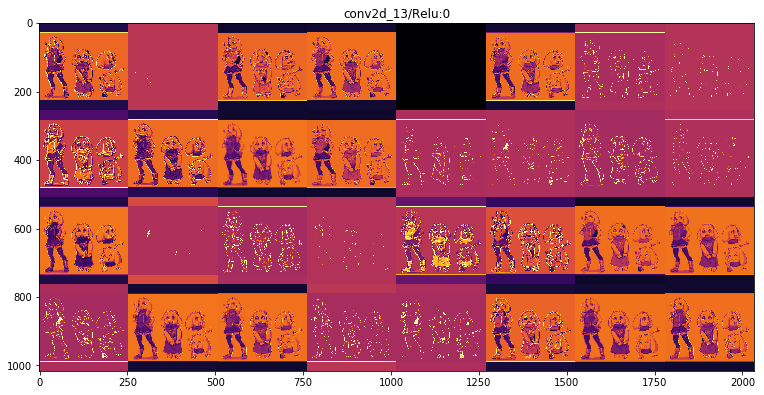

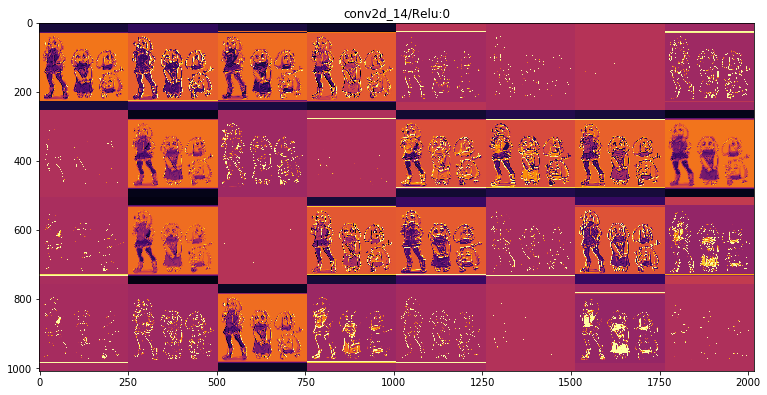

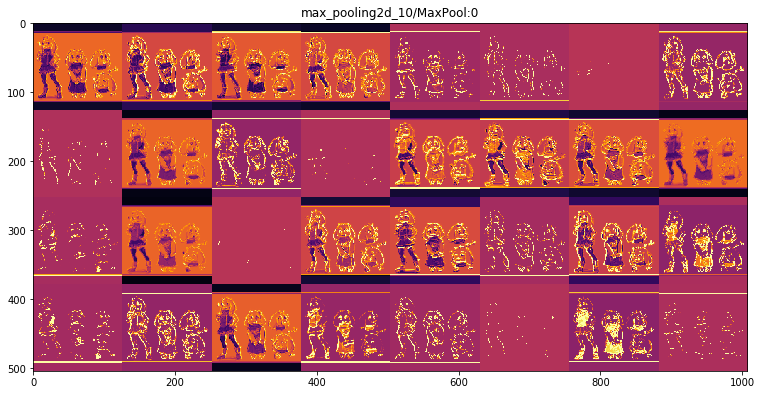

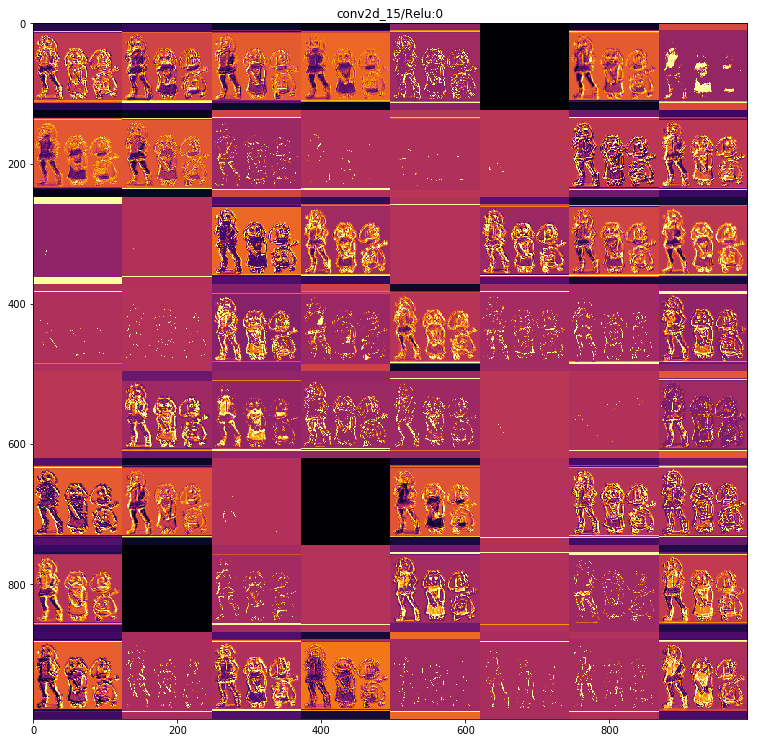

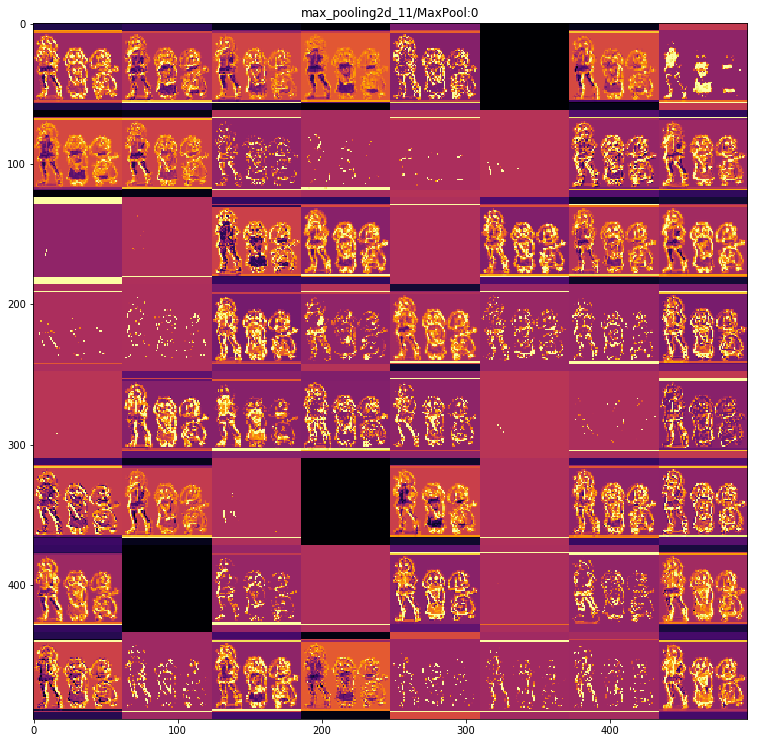

In [357]:
a,b = draw_grid(2239061, model_relu)

##### Sigmoid wrong

Tags = ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']
Actual labels:  [1. 0. 0. 0. 1.]
Predicted (threshold):  [0. 1. 1. 1. 0.]
Predicted (average):  [0 1 1 0 1]


C:\Users\rapha\Anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


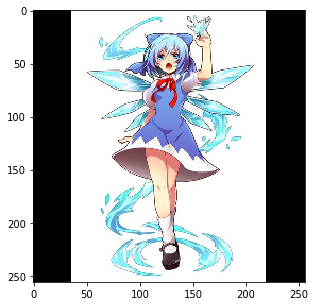

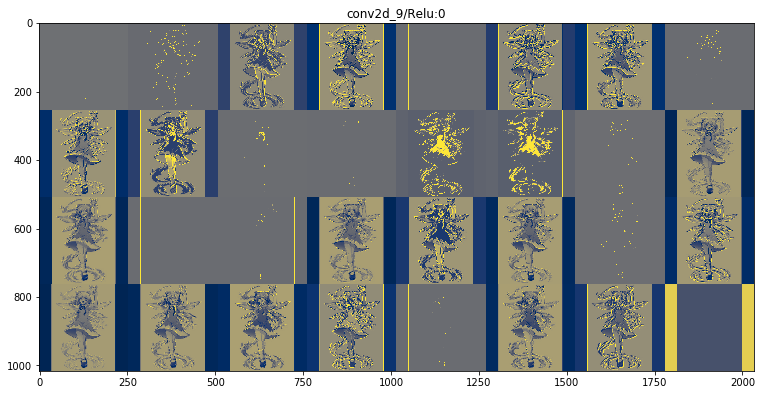

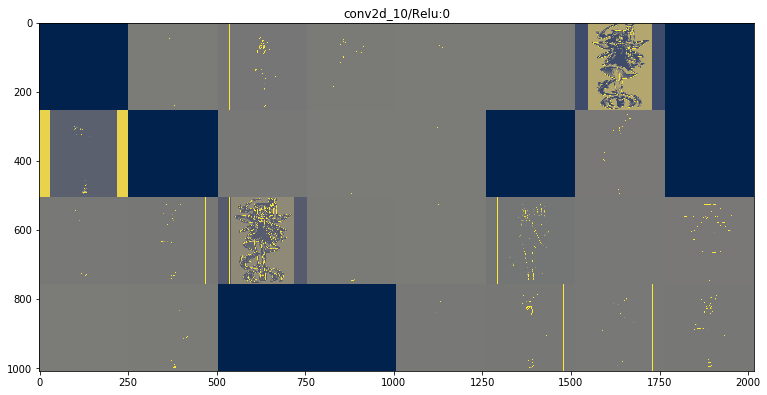

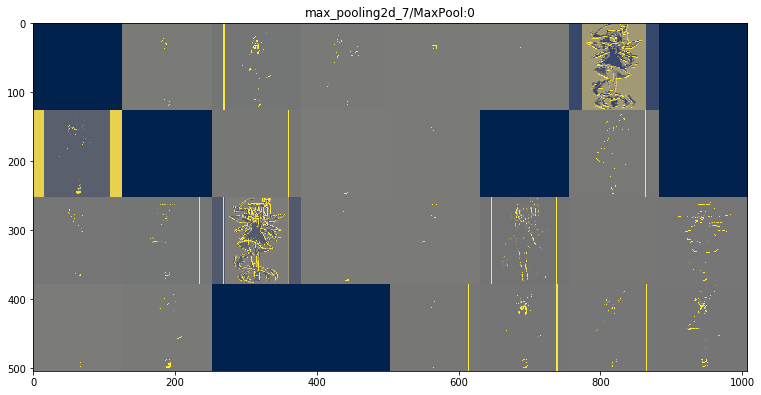

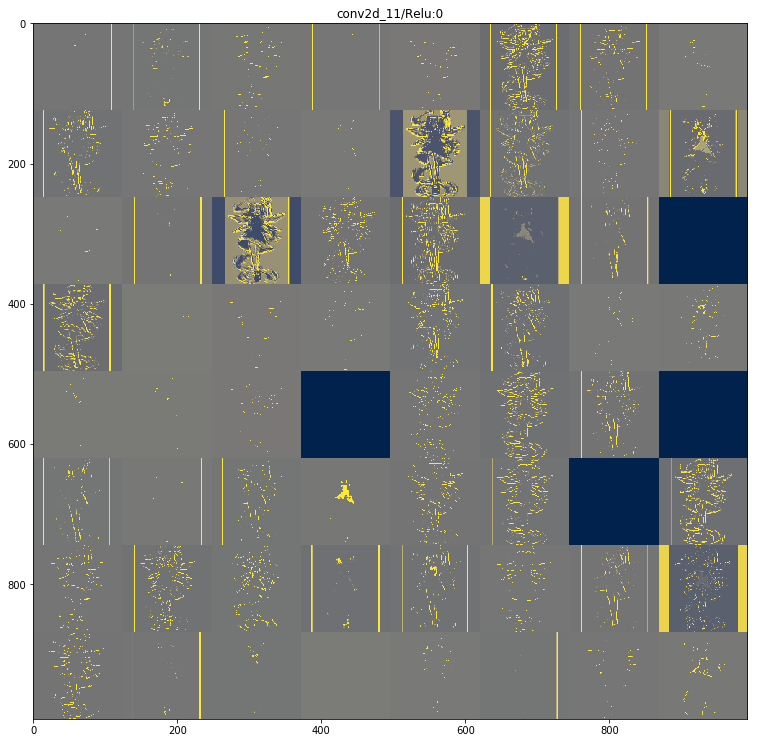

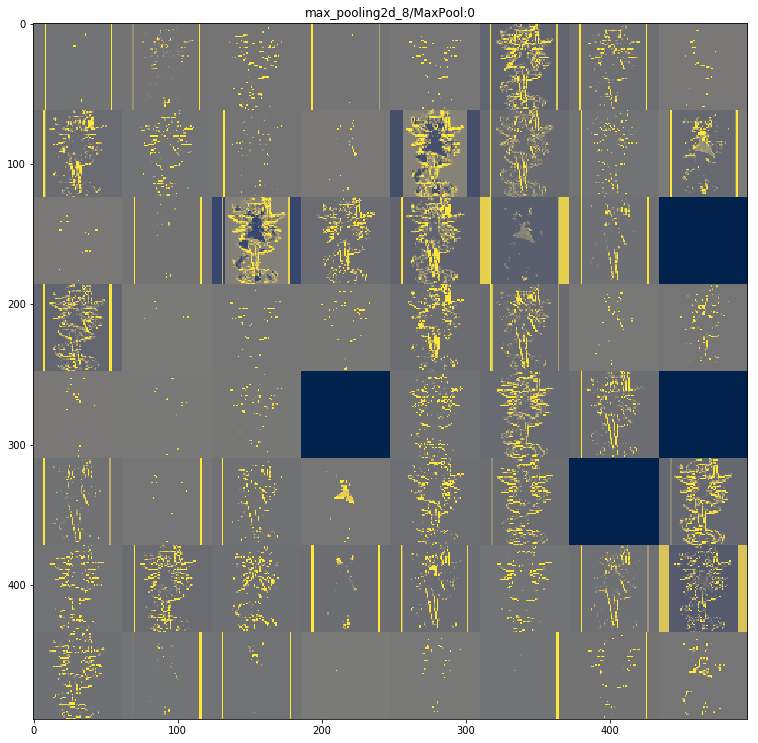

In [382]:
a,b = draw_grid(1652059, model_sig)

['conv2d_9/Relu:0', 'conv2d_10/Relu:0', 'max_pooling2d_7/MaxPool:0', 'conv2d_11/Relu:0', 'max_pooling2d_8/MaxPool:0']


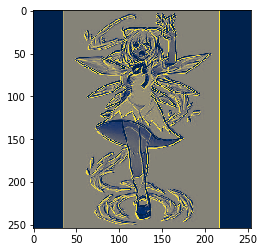

In [384]:
grab_from_grid(a, b, 0, (3,3))
# plt.savefig('aa.png')

Tags = ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']
Actual labels:  [1. 0. 0. 0. 1.]
Predicted (threshold):  [0. 1. 1. 1. 0.]
Predicted (average):  [0 1 1 0 1]


C:\Users\rapha\Anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


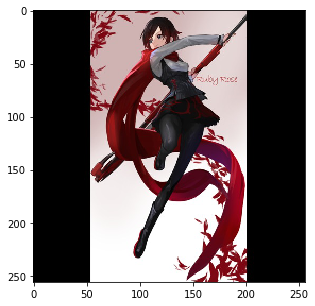

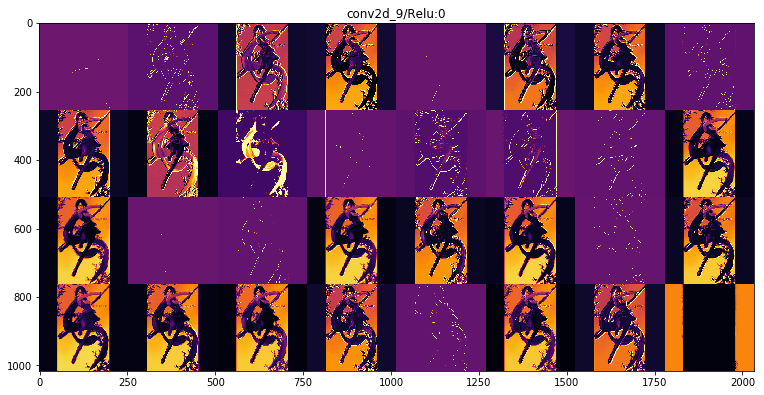

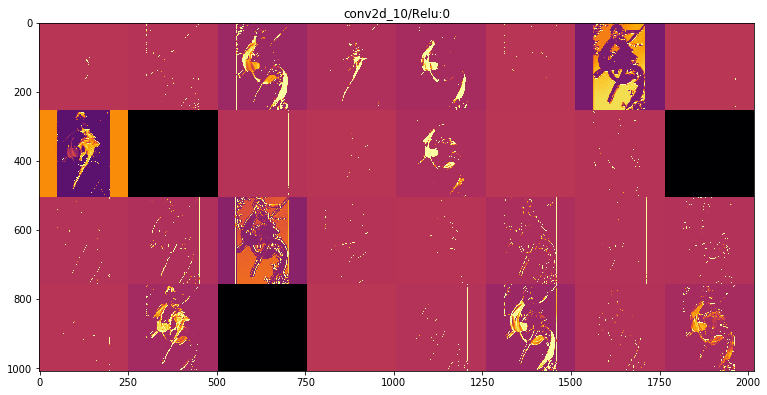

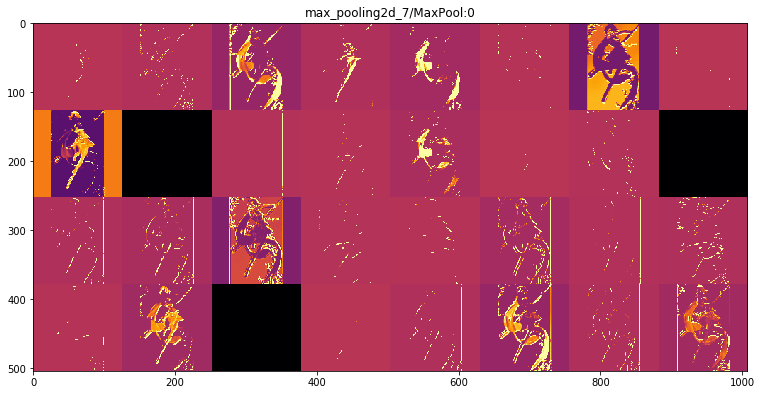

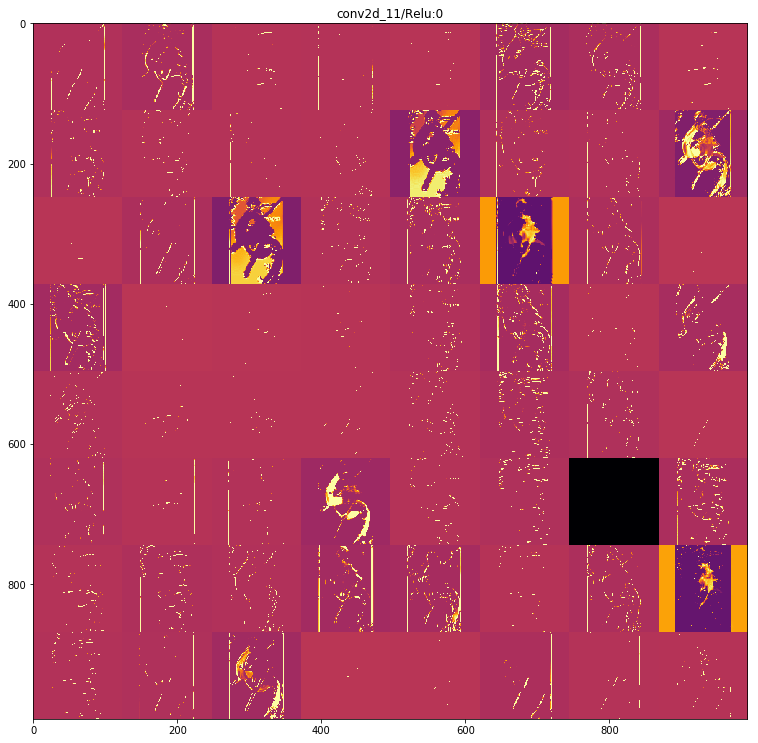

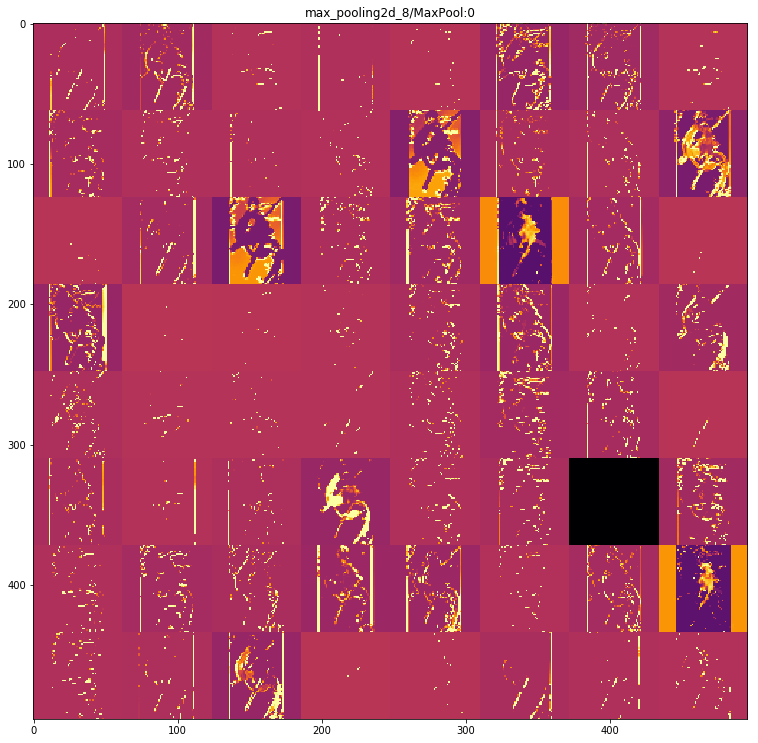

In [359]:
a,b = draw_grid(2777001, model_sig)

['conv2d_9/Relu:0', 'conv2d_10/Relu:0', 'max_pooling2d_7/MaxPool:0', 'conv2d_11/Relu:0', 'max_pooling2d_8/MaxPool:0']


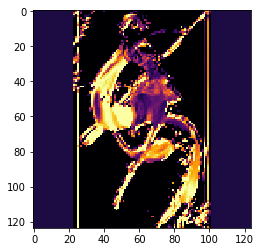

In [360]:
grab_from_grid(a, b, 3, (1,7))
plt.savefig('aa.png')

Tags = ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']
Actual labels:  [1. 0. 0. 0. 1.]
Predicted (threshold):  [0. 1. 1. 1. 0.]
Predicted (average):  [1 1 1 0 0]


C:\Users\rapha\Anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


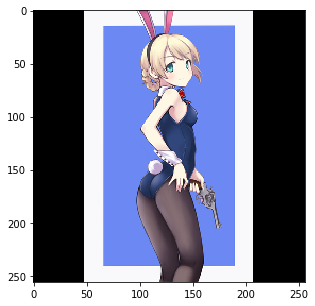

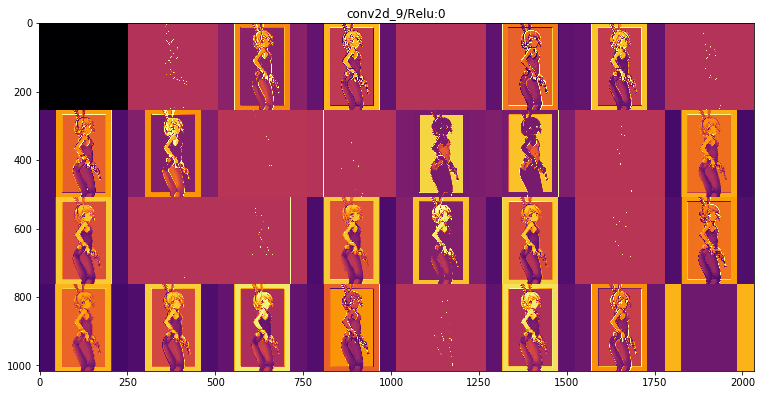

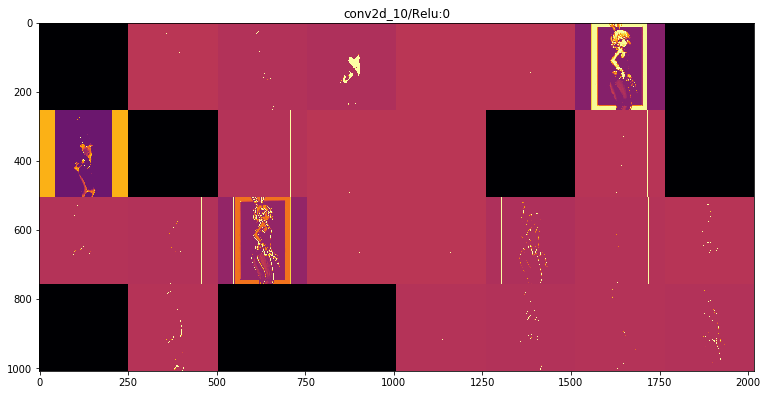

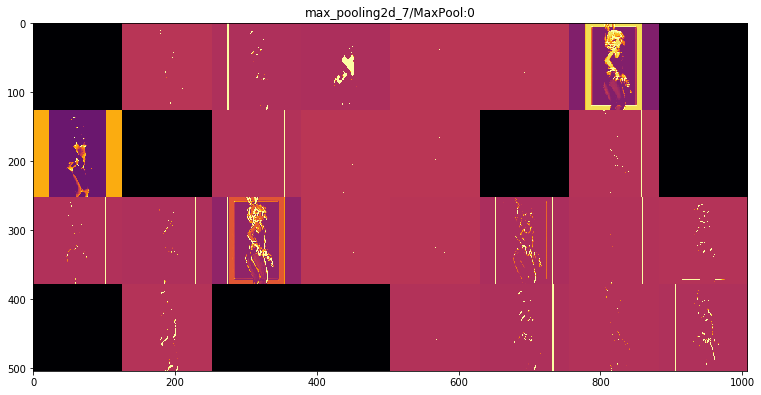

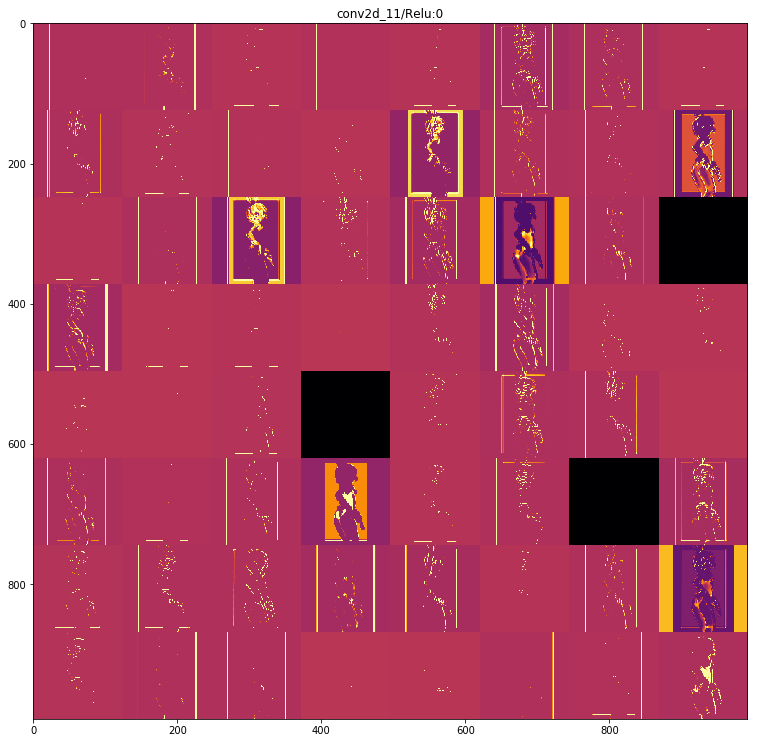

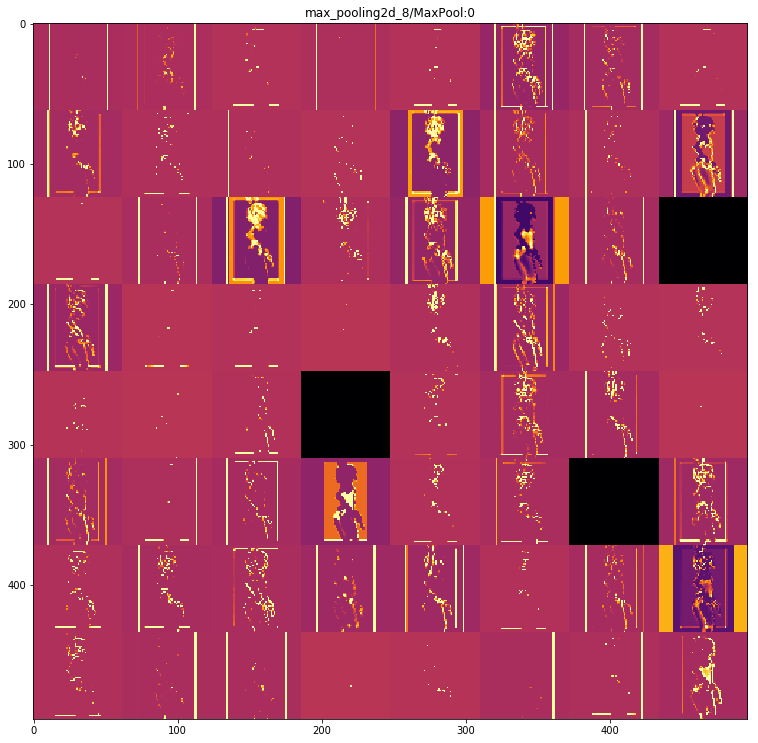

In [361]:
a,b = draw_grid(1979023, model_sig)

Tags = ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']
Actual labels:  [1. 0. 1. 0. 1.]
Predicted (threshold):  [0. 1. 0. 1. 0.]
Predicted (average):  [1 1 0 0 1]


C:\Users\rapha\Anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


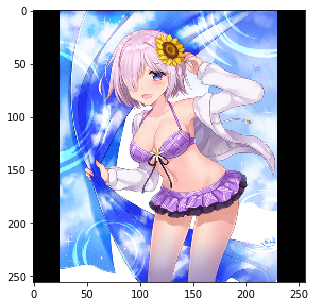

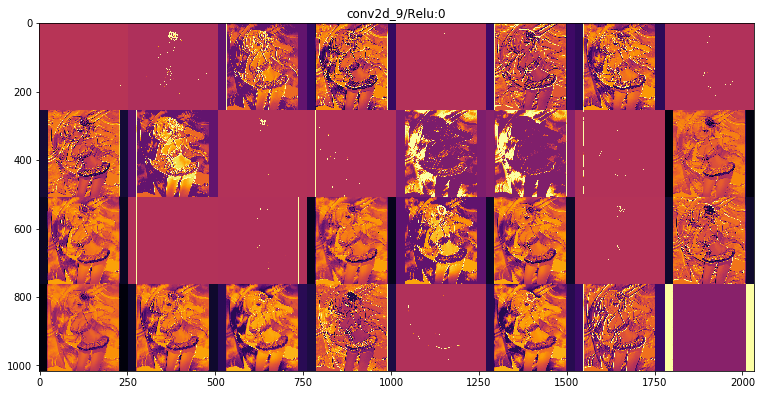

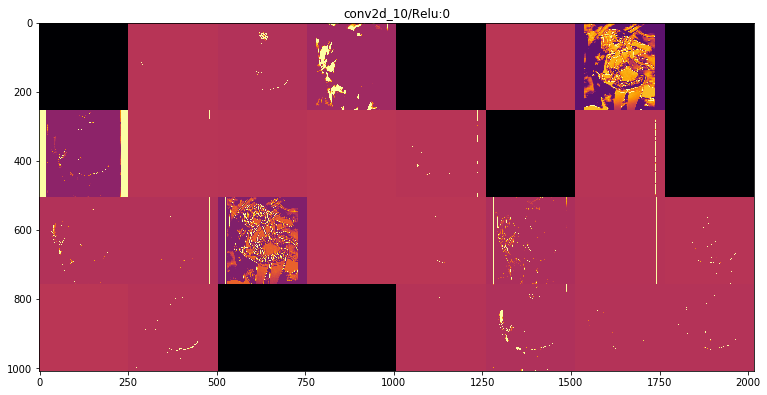

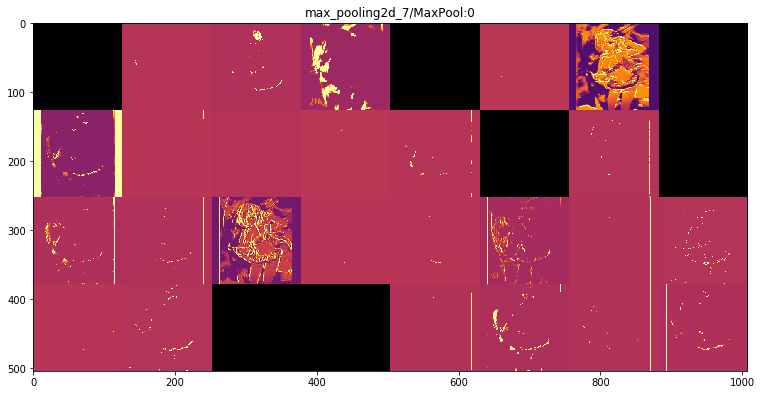

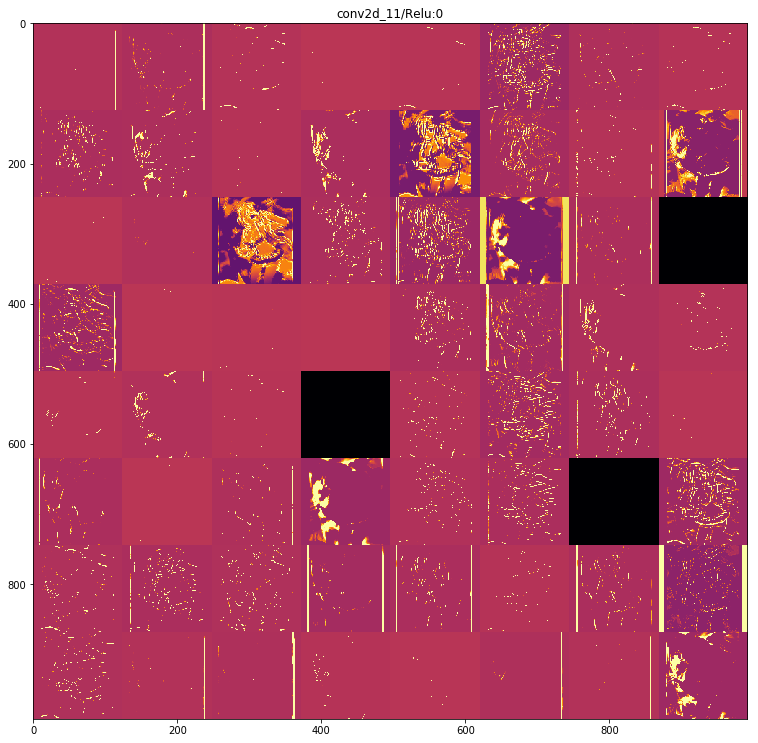

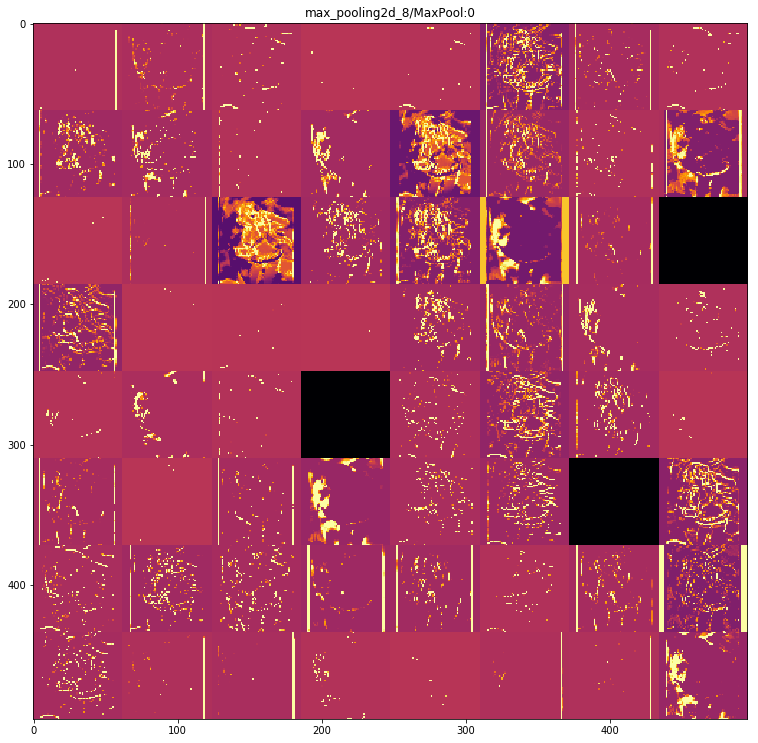

In [362]:
a,b = draw_grid(2759090, model_sig)

Tags = ['1girl', 'long_hair', 'blush', 'smile', 'short_hair']
Actual labels:  [1. 0. 1. 0. 0.]
Predicted (threshold):  [0. 1. 0. 1. 0.]
Predicted (average):  [0 1 0 1 1]


C:\Users\rapha\Anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


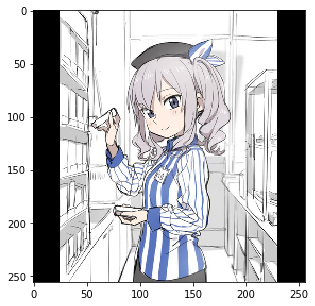

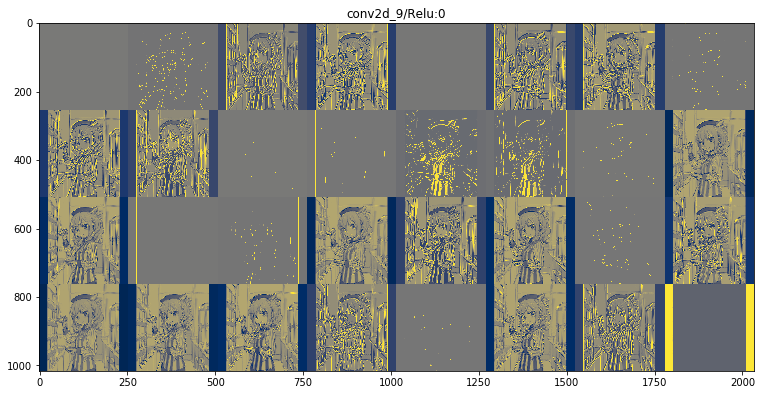

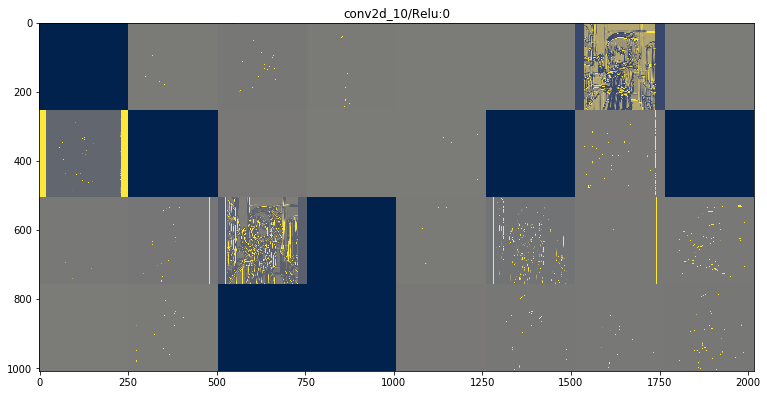

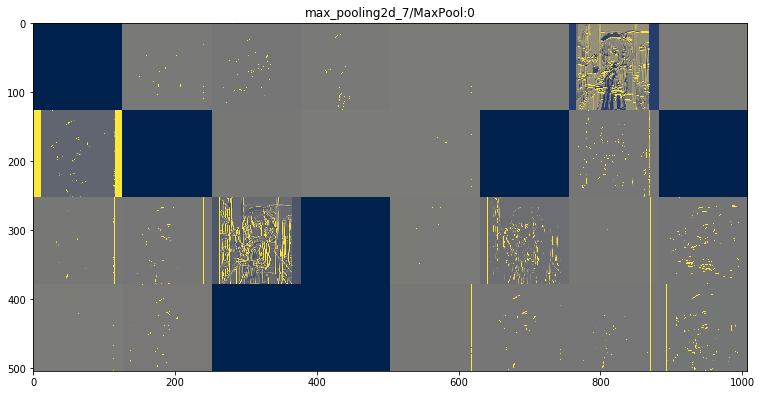

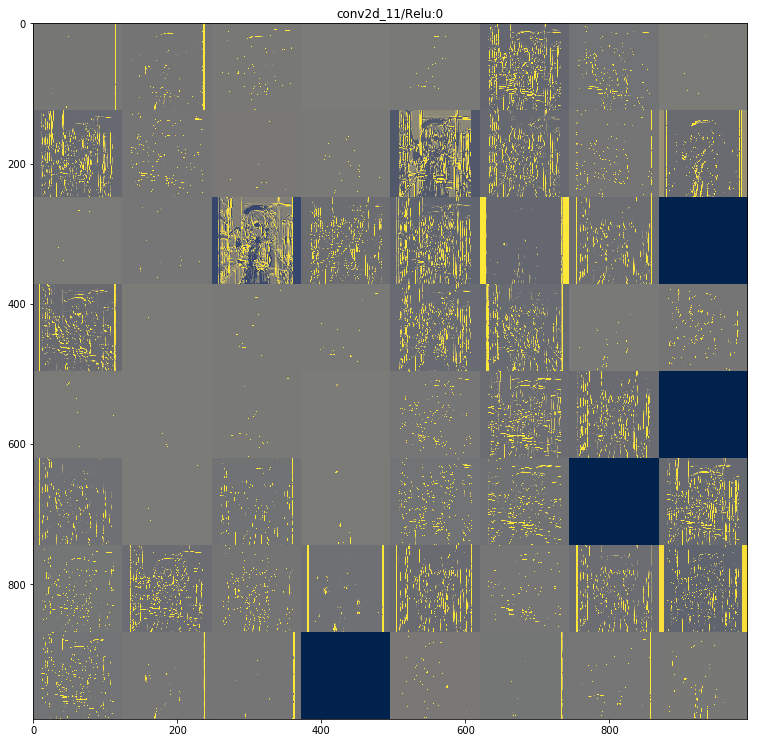

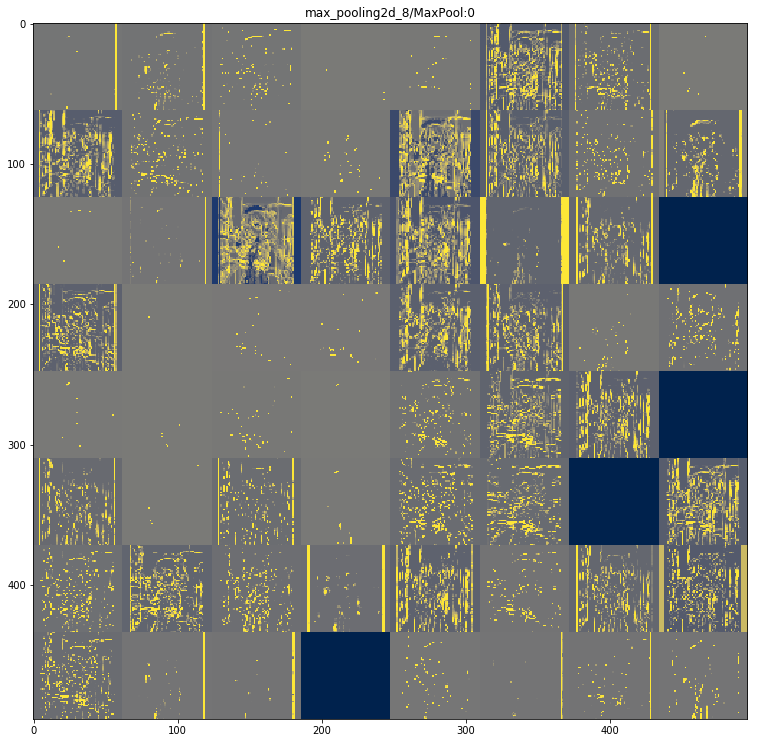

In [385]:
a,b = draw_grid(2275033, model_sig)